# Code setup



In [80]:
rcparams = {
    'axes.titlesize':13,
    'axes.labelsize':9,
    'xtick.labelsize':8,
    'ytick.labelsize':8
}

In [81]:
import numpy as np
import seaborn as sns
from matplotlib.gridspec import GridSpec
import scipy.io as sio
from buildingspy.io.outputfile import Reader
import os

In [82]:
# IPyPublish customization of matplotlib.pyplot and pandas
from ipypublish import nb_setup
plt = nb_setup.setup_matplotlib(output=('pdf','svg'), rcparams=rcparams)
pd = nb_setup.setup_pandas(escape_latex=False)

In [83]:
# Float display precision
pd.set_option('precision', 4)
# Style
sns.set(style='whitegrid')

In [84]:
path = '/media/maousi/Raw/lvad/dnns/'
path_postproc = path + 'dnn_6_layers_64_neurons_test'
path_pred = path + 'dnn_6_layers_64_neurons'

## DNN output

In [85]:
dnn_output_cols = ['Emax', 'Emax0', 'G_Emax', 'k_E']
dnn_output_cols_latex = [r'$E_{max,lv}$', r'$E_{max,lv,0}$',
                         r'$G_{E_{max,lv}}$', r'$k_{E,lv}$']

In [86]:
def load_Ys(path):
    Ytest = pd.read_csv(os.path.join(path, 'Ytest.txt'), sep=' ', header=None)
    Ytestpred = pd.read_csv(os.path.join(path, 'Ytestpred.txt'), sep=' ', header=None)
    Ytest.columns = dnn_output_cols
    Ytestpred.columns = dnn_output_cols
    return Ytest, Ytestpred

In [87]:
Ytest, Yhat = load_Ys(path_pred)
Ytest

,Emax,Emax0,G_Emax,k_E
0,1.8264,2.3606,0.4677,0.0126
1,2.6967,0.3954,0.3970,0.0133
2,0.5683,2.0034,0.3802,0.0113
3,1.5060,1.6586,0.2428,0.0115
4,2.3848,0.3744,0.4593,0.0127
...,...,...,...,...
10495,0.3177,1.3332,0.2707,0.0137
10496,0.7994,0.3133,0.2576,0.0129
10497,1.9519,0.2665,0.2925,0.0119
10498,1.4377,0.9191,0.4519,0.0117


In [88]:
Y = Ytest.join(Yhat, rsuffix='_hat')
Y

,Emax,Emax0,G_Emax,k_E,Emax_hat,Emax0_hat,G_Emax_hat,k_E_hat
0,1.8264,2.3606,0.4677,0.0126,2.0041,2.3624,0.4549,0.0126
1,2.6967,0.3954,0.3970,0.0133,2.4703,0.4736,0.3323,0.0135
2,0.5683,2.0034,0.3802,0.0113,0.4806,2.1706,0.3817,0.0114
3,1.5060,1.6586,0.2428,0.0115,1.6407,1.6467,0.2338,0.0116
4,2.3848,0.3744,0.4593,0.0127,2.3438,0.4480,0.4271,0.0129
...,...,...,...,...,...,...,...,...
10495,0.3177,1.3332,0.2707,0.0137,0.4045,1.1928,0.2911,0.0138
10496,0.7994,0.3133,0.2576,0.0129,0.9445,0.3122,0.2494,0.0134
10497,1.9519,0.2665,0.2925,0.0119,2.0963,0.3220,0.2822,0.0121
10498,1.4377,0.9191,0.4519,0.0117,1.4660,0.9650,0.4351,0.0119


## Results table - Hemodynamic quantities

In [89]:
# Define utility function to format results table
def format_table(table):
    table.index = [
        'Min exact', 'Max exact', 'Mean exact', 'SD exact', 'Min predicted', 
        'Max predicted', 'Mean predicted', 'SD predicted', 'Mean error matrix', 
        'Mean rel error * 100', 'SD error', 'CI min', 'CI max',
    ]
    table.columns = [
        'HR','SAPM','SAPS','SAPD', 'PAPM','PAPS','PAPD','LVEF',
        'LVEDV', 'LVESV', 'CI', 'PCPW'
    ]
    # Multiply relative error by 100
    table.loc['Mean rel error * 100', :] = table.loc['Mean rel error * 100', :] * 100

In [90]:
def get_results_table(path):
    df = pd.read_csv(
        os.path.join(path, 'table.csv'), 
        header=None
    )
    format_table(df)
    return df

In [91]:
table = get_results_table(path_postproc)
table

,HR,SAPM,SAPS,SAPD,PAPM,PAPS,PAPD,LVEF,LVEDV,LVESV,CI,PCPW
Min exact,57.6688,75.0931,86.6690,68.1907,13.7515,25.6458,7.8023,24.3774,85.9782,28.7389,0.0000,3.1130
Max exact,94.9977,102.7649,135.1474,89.1086,23.8084,31.8052,19.8100,71.1097,219.9573,166.3375,2.3927,16.6652
Mean exact,69.2257,92.8353,114.3225,82.0916,17.0144,27.5706,11.7363,53.0081,141.1367,67.7555,-1.0849,7.4277
SD exact,4.5338,4.6996,10.7038,3.3103,1.6742,1.0584,1.9856,9.1554,22.0268,22.4940,0.6848,2.3049
Min predicted,58.8235,73.9405,88.0206,66.7398,13.7002,25.5899,7.7554,24.9653,86.3414,29.8060,0.0000,3.0717
Max predicted,93.7086,102.6495,135.1408,88.9185,24.1323,32.0622,20.1674,70.2835,217.5975,161.1486,2.3902,17.2817
Mean predicted,69.3131,92.7024,114.0795,82.0138,17.0689,27.6068,11.8000,52.8214,140.7731,67.7662,-1.0752,7.4970
SD predicted,4.5915,4.7227,10.7128,3.3553,1.7123,1.0855,2.0289,9.1231,21.2124,21.9619,0.6845,2.3515
Mean error matrix,0.7781,0.3680,0.6308,0.3090,0.0865,0.0588,0.1022,1.0350,1.5412,2.0306,0.0249,0.1175
Mean rel error * 100,1.1028,0.4027,0.5662,0.3823,0.4894,0.2096,0.8277,1.9999,1.0661,3.0489,4.7035,1.4922


## Recover RPMs

In [92]:
import scipy.io as sio

In [93]:
path_normdata = os.path.join(path, 'normdata.mat')
d = sio.loadmat(path_normdata)
# Un-normalize
rpms = d['Xtest'][:, -1] * (d['Xmaxs'][:, -1] - d['Xmins'][:, -1]) + d['Xmins'][:, -1]
rpms = rpms.astype(int)
del d

rpms

array([5100, 5700, 5900, ..., 5800, 5100, 4200])

In [94]:
rpms.shape

(10500,)

## List of all hemodynamic quantities

In [95]:
cols = [
    'HR','SAPM','SAPS','SAPD', 'PAPM','PAPS','PAPD','LVEF',
    'LVEDV', 'LVESV', 'CI', 'PCPW'
]

In [96]:
def load_X_data(path):
    Xhat = pd.read_csv(os.path.join(path, 'Xpredicted.csv'), header=None)
    X = pd.read_csv(os.path.join(path, 'Xexact.csv'), header=None)
    # Format columns
    Xhat.columns = cols
    X.columns = cols
    # Take abs (values of cardiac index are negative)
    X.CI = X.CI.apply(np.abs)
    Xhat.CI = Xhat.CI.apply(np.abs)
    # Join
    X = X.join(Xhat, rsuffix='_hat')
    return X

In [97]:
X = load_X_data(path_postproc)
X['RPM'] = rpms
X

,HR,SAPM,SAPS,SAPD,PAPM,PAPS,PAPD,LVEF,LVEDV,LVESV,...,SAPD_hat,PAPM_hat,PAPS_hat,PAPD_hat,LVEF_hat,LVEDV_hat,LVESV_hat,CI_hat,PCPW_hat,RPM
0,65.5738,98.7117,126.0509,85.0420,15.7233,26.6792,10.2453,67.8674,122.0103,39.2050,...,85.0524,15.7176,26.6838,10.2345,67.8369,122.0649,39.2598,1.5267,5.5893,5100
1,68.9655,92.0455,114.1239,81.0062,17.2494,27.6855,12.0314,50.6480,157.1006,77.5323,...,80.8547,17.3832,27.7693,12.1901,49.4958,157.7703,79.6806,1.1678,8.1240,5700
2,77.8311,88.0041,104.9807,79.5158,16.9213,27.5070,11.6285,45.5935,156.3355,85.0566,...,79.5189,16.8444,27.4442,11.5444,45.7406,157.2117,85.3021,0.6282,7.7116,5900
3,75.5316,89.7150,107.3361,80.9044,16.7330,27.4400,11.3795,47.5920,139.7639,73.2475,...,80.8864,16.7724,27.4817,11.4178,48.6380,137.2515,70.4952,0.5797,7.4334,5800
4,66.6667,93.0076,118.0554,80.4836,16.9057,27.5111,11.6030,54.7992,135.4972,61.2458,...,80.5788,17.0027,27.5800,11.7141,55.5300,135.8666,60.4199,1.1578,7.4411,5100
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10495,64.8649,87.8084,97.2772,83.0740,15.9475,26.7169,10.5628,46.5425,148.1157,79.1789,...,83.1009,15.8969,26.6866,10.5021,47.3701,147.8025,77.7883,0.0000,6.0195,4400
10496,64.5161,98.3100,120.8898,87.0200,15.0392,26.1800,9.4688,63.5149,122.1425,44.5638,...,86.8315,15.0870,26.2433,9.5089,64.2591,121.8214,43.5401,1.0658,4.7679,4300
10497,77.6315,88.2705,103.9155,80.4479,18.0262,28.0734,13.0027,37.5823,154.9213,96.6983,...,79.6571,18.2322,28.2301,13.2333,37.4468,155.0158,96.9674,0.3956,9.1405,5800
10498,67.7966,95.7701,123.4640,81.9231,17.1084,27.6653,11.8300,59.0582,141.2609,57.8348,...,82.1099,17.1539,27.6886,11.8865,58.0694,142.2267,59.6365,1.7149,7.3985,5100


# Introduction

## Context

The Framework has changed quiet a bit since the last results were obtained (e.g. those in notebook 11). We now have 21 different datasets characterized by different pump speeds. We concatenated those datasets into a new one in order to train a single DNN architecture for different pump configurations. 




In order to allow the DNN to take into account a varying pump speed, we added the pump speed to the vector of features containing Fourier coefficients. A instance of feature for sample $n = 1, \dots, N$ is:

$$[a_{1,0}^{(n)}, a_{1,1}^{(n)}, \dots, a_{1,K}^{(n)}, b_{1,1}^{(n)}, \dots, b_{1,K}^{(n)}, a_{2,0}^{(n)}, a_{2,1}^{(n)}, \dots, a_{2,K}^{(n)}, b_{2,1}^{(n)}, \dots, b_{2,K}^{(n)}, \text{RPM}^{(n)}]$$

where the index $i$ in $a_{i,j}$ indexes the 0D input variable, either SAP or PAS.

We tried several architectures on this big dataset, as presented in the notebook 18. 

## Aim

The selected architecture has 6 hidden layers, 64 neurons. We choose the number of Fourier coefficients $K=50$. We want to analyze the accuracy of the results and the output of the MATLAB postprocessing code for the exact vs predicted simulations performed on the test set. 

# Check a few simulations

In [98]:
def time_range(tmin, tmax, t, signal):
    ids = np.where(np.logical_and(t >= tmin, t <= tmax))
    return t[ids], signal[ids]

def read_simulations(paths, rpms, variables, tmin, tmax):
    data = {}
    for file, rpm in zip(paths, rpms):
        reader = Reader(file, 'dymola')
        data[rpm] = [
            time_range(tmin, tmax, *reader.values(v)) for v in variables
        ]
    return data

In [99]:
def plot_simulations(data):
    fig, ax = plt.subplots(len(data), 1, figsize=(10, 10))

    for i, (rpm_c, data) in enumerate(data.items()):
        ax1 = ax[i]
        ax2 = ax1.twinx()

        (t1, pressure), (t2, valve_flow), (t3, aortic_flow), (t4, rpm), (t5, lv_pressure) = data
        #(t1, pressure), (t2, valve_flow), (t3, arotic_flow), (t4, rpm) = data[0], data[1], data[2], data[3]
        l1, = ax1.plot(t4, rpm/100, 'k--', linewidth=1)
        l2, = ax1.plot(t1, pressure, 'b')
        l3, = ax1.plot(t1, lv_pressure, '--', linewidth=0.5)
        l4, = ax2.plot(t2, valve_flow, 'g--', linewidth=1)
        l5, = ax2.plot(t3, aortic_flow, 'r')
        #ax2.set_ylim([min(flow)-25, max(flow)+25])
        #ax1.set_ylim(-5, max(max(pressure), max(flow)))
        #ax2.plot(t2, flow)

        # Manage x axis
        if i == 2:
            ax1.set_xlabel('Time [s]')
        else:
            pass#ax1.set_xticks([])
        
        ax1.set_ylabel('Systemic pressure [mmHg]\nLV pressure [mmHg]\nPump speed [RPM/100]')
        ax2.set_ylabel('Aortic flow [ml/s]\nValve flow [ml/s]')
        #ax1.yaxis.label.set_color('b')
        # Align the grids
        #ax2.set_yticks(np.linspace(ax2.get_yticks()[0], ax2.get_yticks()[-1], len(ax1.get_yticks())))
        ax2.grid(False)
        ax2.set_ylim([-5, 1.5*max(aortic_flow)])
        #ax1.set_title('RPM mean = {}'.format(rpm_c))

    plt.subplots_adjust(hspace=.2)
    ax2.legend(handles = [l1,l2,l3, l4, l5], labels=['LVAD speed', 'SAP', 'LV pressure', 'Aortic valve flow', 'Aortic flow'], 
               bbox_to_anchor=(0.5, -0.35), fancybox=False, shadow=False, ncol=5, loc='center')

In [100]:
variables = ['SystemicArteries.PC', 'AorticValve.Inlet.Q',
             'SystemicArteries.Inlet.Q', 'LVAD.RPM', 'LeftVentricle.Inlet.P']

path_sims = '/media/maousi/Raw/lvad/dnns/dnn_6_layers_64_neurons_test/outputs'

simulation_ids = [0, 137, 2, 250]

In [101]:
paths = [
    os.path.join(path_sims, 'Ursino1998Model_VAD2_output_{}_exact.mat'.format(n))
    for n in simulation_ids
]
plot_rpms = rpms[simulation_ids]
data = read_simulations(paths, plot_rpms, variables, 26.0, 30.0)

In [102]:
print('RPMs corresponding to picked simulations:', list(data.keys()))

RPMs corresponding to picked simulations: [5100, 5900, 4000]


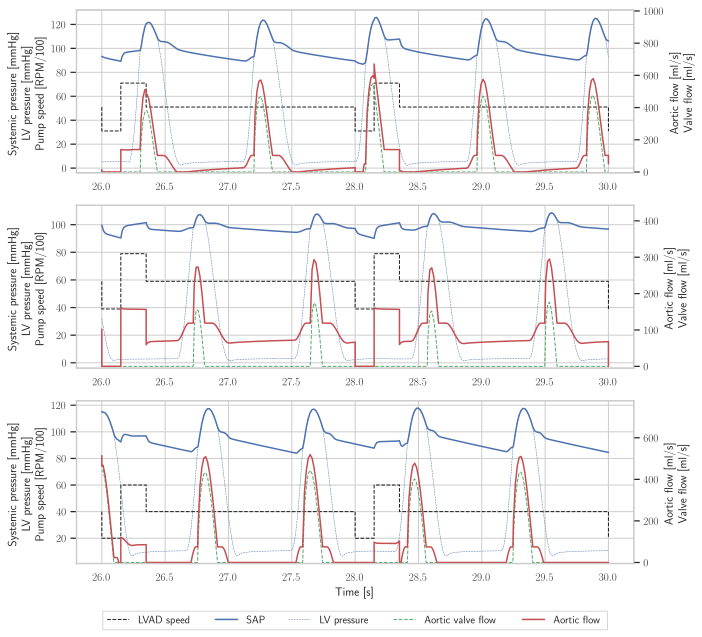

In [103]:
plot_simulations(data)

# DNN output

In [123]:
def plot_dnn_performance(Ytest, Yhat):
    
    fig, ax = plt.subplots(2, 2, figsize=(9,6))
    axlst = ax.ravel()
    colors = sns.color_palette(n_colors=4)
    
    for i, (col, color) in enumerate(zip(dnn_output_cols, colors)):
        axlst[i].scatter(Ytest.loc[:, col], Yhat.loc[:, col], s=3, color=color)
        axlst[i].set_title(dnn_output_cols_latex[i])
        axlst[i].set_xlabel(r'Exact')
        axlst[i].set_ylabel(r'Predicted')
    
    offset = .0002
    ax[1, 1].set_xlim([Ytest.loc[:, 'k_E'].min()-offset, Ytest.loc[:, 'k_E'].max()+offset])
    ax[1, 1].set_ylim([Yhat.loc[:, 'k_E'].min()-offset, Yhat.loc[:, 'k_E'].max()+offset])
    
    plt.tight_layout()
    return fig, ax

## Predicted vs exact

In [138]:
fig, ax = plot_dnn_performance(Ytest, Yhat)
plt.savefig('figs/dnn_predicted_vs_exact.eps')

## Errors

We compute the relative error of the DNN output variable $y_i$ as follows:

$$\text{rel err} = \frac{|y_i - \hat y_i|}{y_i}$$

In [106]:
Yerr = pd.DataFrame()
for col in dnn_output_cols:
    Yerr[col] = np.abs(Y[col] - Y[col+'_hat']) / Y[col]
Yerr

,Emax,Emax0,G_Emax,k_E
0,0.0973,0.0008,0.0272,0.0011
1,0.0840,0.1977,0.1630,0.0151
2,0.1544,0.0834,0.0037,0.0077
3,0.0894,0.0072,0.0372,0.0101
4,0.0172,0.1965,0.0703,0.0101
...,...,...,...,...
10495,0.2732,0.1054,0.0751,0.0100
10496,0.1814,0.0036,0.0320,0.0413
10497,0.0740,0.2082,0.0352,0.0126
10498,0.0197,0.0499,0.0371,0.0172


In [184]:
statserr = Yerr.describe().loc[['min', 'mean', '50%', 'max', 'std'], :].rename(
    index={'min':'Min', 'max': 'Max', 'mean': 'Mean', 'std': 'Std', '50%': 'Median'},
    columns=dict(zip(Yerr.columns, dnn_output_cols_latex))
)
statserr

,"$E_{max,lv}$","$E_{max,lv,0}$","$G_{E_{max,lv}}$","$k_{E,lv}$"
Min,2.6667e-05,1.0639e-06,1.6993e-05,1.2660e-06
Mean,9.4869e-02,7.9212e-02,1.3408e-01,1.0774e-02
Median,6.0641e-02,4.7198e-02,9.8353e-02,8.7063e-03
Max,3.1187e+00,1.1135e+00,9.0771e-01,8.7101e-02
Std,1.3023e-01,1.0367e-01,1.2419e-01,8.8921e-03


In [181]:
formatter = lambda n: np.format_float_scientific(n, precision=2)
caption = """Relative absolute errors of the DNN output for the six layers and sixty-four neurons architecture"""
label = "tab:dnn_relerr"
latex = statserr.to_latex(float_format=formatter, caption=caption, label=label)
latex = latex.replace('\\toprule', '\hline')
latex = latex.replace('\\midrule', '\hline')
latex = latex.replace('\\bottomrule', '\hline')
with open('data/dnn_squared_errors_final.tex', 'w') as f:
    f.write(latex)

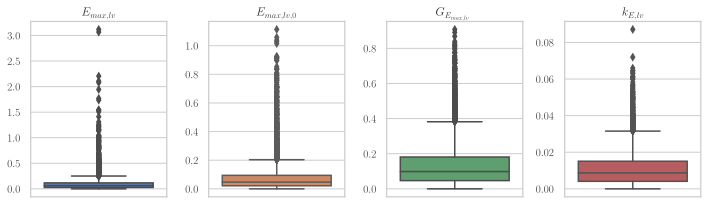

In [24]:
fig, ax = plt.subplots(1, 4, figsize=(10, 3))
colors = sns.color_palette(n_colors=4)

for a, var, vartex, color in zip(ax, dnn_output_cols, dnn_output_cols_latex, colors):
    sns.boxplot(data=Yerr, y=var, ax=a, color=color)
    a.set_ylabel('')
    #a.set_yscale('log')
    a.set_title(vartex)

plt.tight_layout()

# Hemodynamic quantities

## Matlab table

In [25]:
table

,HR,SAPM,SAPS,SAPD,PAPM,PAPS,PAPD,LVEF,LVEDV,LVESV,CI,PCPW
Min exact,57.6688,75.0931,86.6690,68.1907,13.7515,25.6458,7.8023,24.3774,85.9782,28.7389,0.0000,3.1130
Max exact,94.9977,102.7649,135.1474,89.1086,23.8084,31.8052,19.8100,71.1097,219.9573,166.3375,2.3927,16.6652
Mean exact,69.2257,92.8353,114.3225,82.0916,17.0144,27.5706,11.7363,53.0081,141.1367,67.7555,-1.0849,7.4277
SD exact,4.5338,4.6996,10.7038,3.3103,1.6742,1.0584,1.9856,9.1554,22.0268,22.4940,0.6848,2.3049
Min predicted,58.8235,73.9405,88.0206,66.7398,13.7002,25.5899,7.7554,24.9653,86.3414,29.8060,0.0000,3.0717
Max predicted,93.7086,102.6495,135.1408,88.9185,24.1323,32.0622,20.1674,70.2835,217.5975,161.1486,2.3902,17.2817
Mean predicted,69.3131,92.7024,114.0795,82.0138,17.0689,27.6068,11.8000,52.8214,140.7731,67.7662,-1.0752,7.4970
SD predicted,4.5915,4.7227,10.7128,3.3553,1.7123,1.0855,2.0289,9.1231,21.2124,21.9619,0.6845,2.3515
Mean error matrix,0.7781,0.3680,0.6308,0.3090,0.0865,0.0588,0.1022,1.0350,1.5412,2.0306,0.0249,0.1175
Mean rel error * 100,1.1028,0.4027,0.5662,0.3823,0.4894,0.2096,0.8277,1.9999,1.0661,3.0489,4.7035,1.4922


## Hemodynamic quantities distribution for exact- vs prediction-based simulations

In [70]:
def plt_compare(data, col, ax, color):
    # Plot identity line
    coord1 = min(data[col].min(), data[col+'_hat'].min())
    coord2 = max(data[col].max(), data[col+'_hat'].max())
    ax.plot([coord1, coord2], [coord1, coord2], '--k')
    # Scatter plot predicted vs exact
    sns.scatterplot(x=col, y=col+'_hat', data=data, ax=ax, color=color)
    ax.set_xlabel('$'+col+'$')
    ax.set_ylabel('$\widehat{' + col + '}$')

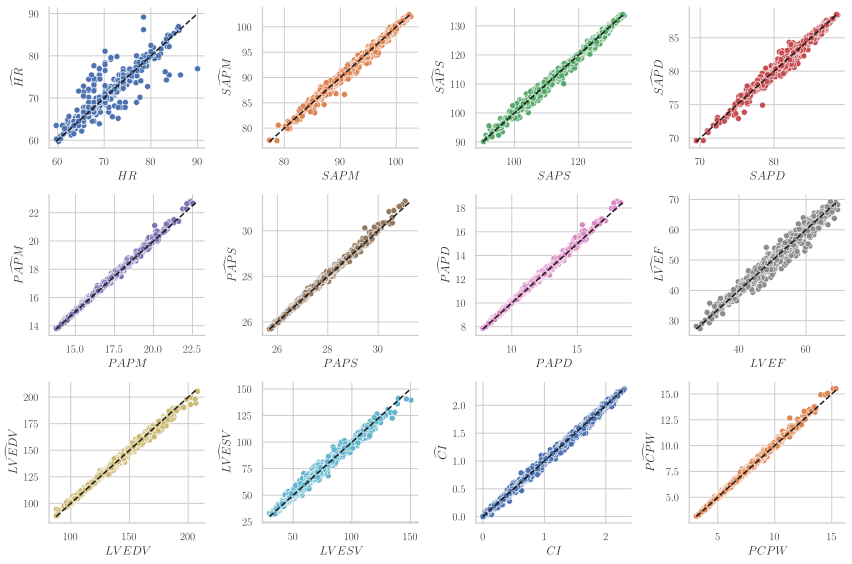

In [71]:
fig, ax = plt.subplots(3, 4, figsize=(12, 8))
axlst = ax.ravel()

# We don't plot all 10,000 items -> very unstable
N = X.shape[0]
plot_ids = np.random.choice(N, size=int(N*.1), replace=False)
colors = sns.color_palette(n_colors=len(cols))

for i, col in enumerate(cols):
    plt_compare(X.iloc[plot_ids], col, axlst[i], colors[i])
#plt.subplots_adjust(wspace=.3, hspace=.3)
sns.despine()
plt.tight_layout()

# Something's wrong

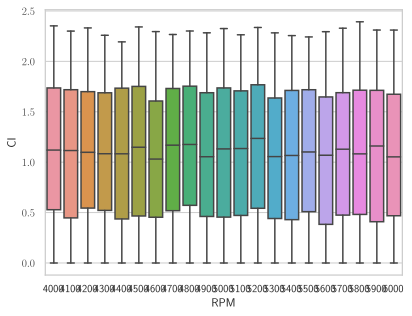

In [82]:
sns.boxplot(data=X, y='CI', x='RPM')

In [83]:
def plot_simulations(data_hf):
    fig, ax = plt.subplots(len(data_hf), 1, figsize=(10, 10))

    for i, (rpm_c, data) in enumerate(data_hf.items()):
        ax1 = ax[i]
        ax2 = ax1.twinx()

        (t1, pressure), (t2, valve_flow), (t3, aortic_flow), (t4, rpm), (t5, lv_pressure) = data
        #(t1, pressure), (t2, valve_flow), (t3, arotic_flow), (t4, rpm) = data[0], data[1], data[2], data[3]
        ax1.plot(t4, rpm/100, 'k--', linewidth=1)
        ax1.plot(t1, pressure, 'b')
        ax1.plot(t1, lv_pressure, '--', linewidth=0.5)
        ax2.plot(t2, valve_flow, 'g--', linewidth=1)
        ax2.plot(t3, aortic_flow, 'r')
        #ax2.set_ylim([min(flow)-25, max(flow)+25])
        #ax1.set_ylim(-5, max(max(pressure), max(flow)))
        #ax2.plot(t2, flow)

        # Manage x axis
        if i == 2:
            ax1.set_xlabel('Time [s]')
        else:
            pass#ax1.set_xticks([])
        
        ax1.set_ylabel('Systemic pressure [mmHg]\nLV pressure [mmHg]\nPump speed [RPM/100]')
        ax2.set_ylabel('Aortic flow [ml/s]\nValve flow [ml/s]')
        #ax1.yaxis.label.set_color('b')
        # Align the grids
        #ax2.set_yticks(np.linspace(ax2.get_yticks()[0], ax2.get_yticks()[-1], len(ax1.get_yticks())))
        ax2.grid(False)
        ax2.set_ylim([-5, 1.5*max(aortic_flow)])
        #ax1.set_title('RPM mean = {}'.format(rpm_c))

    plt.subplots_adjust(hspace=.2)